In [1]:
import scanpy as sc
from copy import copy, deepcopy
from tqdm import tqdm

import numpy as np
import pandas as pd
from scipy.ndimage import distance_transform_edt as dt
from skimage import measure
from scipy.stats import *
import phate

import matplotlib.pyplot as plt
from matplotlib import cm, colors
import seaborn as sns
import plotly.express as px

from spatial_funcs import *

# Input

In [2]:
# load AnnData
fpath = '/Users/wangk/Desktop/TEMPOmap/2021-07-16-Rena-Hela-EU-3D-segmentation'
sample_list = ['1h_labeling', '1h_labeling_1h_wash', '1h_labeling_2h_wash', '1h_labeling_4h_wash', '1h_labeling_6h_wash', '20h_labeling']
adata_all = sc.read_h5ad(os.path.join(fpath, '2021-10-06-Rena-EU-starmap-cc.h5ad'))
adata_si = sc.read_h5ad(os.path.join(fpath, '2021-09-24-Rena-EU-starmap-raw-KD-combined.h5ad'))
adata_all.obs['KD_label_combined'] = adata_si.obs['KD_label_combined']

In [3]:
# gene and sample lists
genes = adata_all.var.index
genesToIndex = genes_to_index(genes)
sample_list = ['1h_labeling', '1h_labeling_1h_wash', '1h_labeling_2h_wash', '1h_labeling_4h_wash', '1h_labeling_6h_wash', '20h_labeling']
batchCorr_genes = ['METTL14', 'METTL3', 'YTHDC2', 'YTHDF1', 'YTHDF2', 'YTHDF3'] # for batch correction
starmap_genes = ['METTL14', 'METTL3', 'YTHDC2', 'YTHDF1', 'YTHDF2', 'YTHDF3', 'YTHDC1']

In [4]:
genes[np.isin(genes, starmap_genes, invert=True)]
pd.DataFrame(genes[np.isin(genes, starmap_genes, invert=True)]).to_csv('991 genes.csv')

In [5]:
# color code
cc_col = {'G1': '#663399', 'S': '#FFD700', 'G2M': '#66CDAA'}
sam_col = {'1h_labeling': '#9e0142', '1h_labeling_1h_wash': '#f88d52', '1h_labeling_2h_wash': '#ffffbf', '1h_labeling_4h_wash': '#89d0a4', '1h_labeling_6h_wash': '#5e4fa2'}

# Preprocessing

In [5]:
adata_5sam = separate_adata_by_sample(adata_all, sample_list[:5])
adata_5sam_batch = deepcopy(adata_5sam)
batch_corr = []
for sample in sample_list[:5]:
    sg = adata_5sam_batch.X[np.isin(adata_5sam_batch.obs['sample'], sample), :]
    sg = sg[:,np.isin(adata_5sam_batch.var.index, batchCorr_genes)]
    sg_avg = np.average(sg)
    batch_corr.append(sg_avg)
    adata_5sam_batch.X[np.isin(adata_5sam_batch.obs['sample'], sample)] /= sg_avg

In [50]:
# adata_5sam = separate_adata_by_sample(adata_all, sample_list[:5])
# adata_5sam_batch = deepcopy(adata_5sam)
# batch_corr = []
# for sample in sample_list[:5]:
#     sg = adata_5sam_batch.X[np.isin(adata_5sam_batch.obs['sample'], sample), :]
#     sg = sg[:,np.isin(adata_5sam_batch.var.index, batchCorr_genes)]
#     sg_avg = np.average(sg)
#     batch_corr.append(sg_avg)
# batch_corr /= batch_corr[0]
# for i, sample in enumerate(sample_list[:5]):
#     adata_5sam_batch.X[np.isin(adata_5sam_batch.obs['sample'], sample)] /= batch_corr[i]

In [6]:
adata_exp = adata_remove_cells(adata_5sam_batch, 'KD_label_combined', 'siYTHDC1')
adata_exp = adata_remove_genes(adata_exp, starmap_genes)

# Expression Data

### UMAP

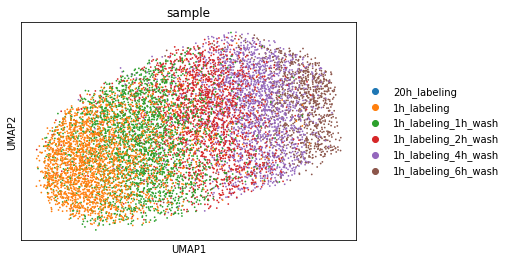

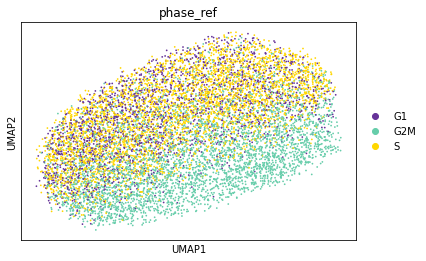

In [10]:
pp_pca_umap(adata_exp, pp=True)
sc.pp.neighbors(adata_exp, metric='euclidean', n_neighbors=15)
sc.tl.umap(adata_exp, min_dist=0.5)
sc.pl.umap(adata_exp, color='sample')
sc.pl.umap(adata_exp, color='phase_ref', palette={'G1': 'rebeccapurple', 'G2M': 'mediumaquamarine', 'S': 'gold'})

In [13]:
adata_exp.write('total_expr.h5ad')

### PHATE

In [11]:
phate_exp = phate.PHATE(n_jobs=1, knn=30, decay=15, t='auto', gamma=1)
Y_phate = phate_exp.fit_transform(adata_exp)
phate_exp.set_params(n_components=3)
Y_phate_3d = phate_exp.transform()

Calculating PHATE...
  Running PHATE on 9833 observations and 991 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 0.38 seconds.
    Calculating KNN search...
    Calculated KNN search in 20.05 seconds.
    Calculating affinities...
    Calculated affinities in 33.69 seconds.
  Calculated graph and diffusion operator in 56.40 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 40.30 seconds.
    Calculating KMeans...
    Calculated KMeans in 9.53 seconds.
  Calculated landmark operator in 72.61 seconds.
  Calculating optimal t...
    Automatically selected t = 2
  Calculated optimal t in 2.37 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.16 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.06 seconds.
Calculated PHATE in 136.66 seconds.
Calculating metric MDS...
Calculated metric MDS in 41.89 seconds.


In [12]:
# np.save('total_expr_PHATE', Y_phate_3d)
pd.DataFrame(Y_phate_3d).to_csv('PHATE_single-cell.csv')

In [10]:
df_exp = pd.DataFrame(Y_phate_3d, columns=['x', 'y', 'z'])
df_exp['cell_cycle'] = adata_exp.obs['phase_ref'].values
df_exp['orig_index'] = adata_exp.obs['orig_index'].values
df_exp['sample'] = adata_exp.obs['sample'].values
df_exp

,x,y,z,cell_cycle,orig_index,sample
0,0.027526,0.004368,0.001465,G2M,0,1h_labeling_6h_wash
1,0.017256,0.001931,-0.001461,G1,3,1h_labeling_6h_wash
2,0.016392,0.002585,0.000786,G2M,4,1h_labeling_6h_wash
3,0.026381,0.003655,0.001841,G2M,6,1h_labeling_6h_wash
4,0.017837,0.002847,0.000246,G2M,7,1h_labeling_6h_wash
...,...,...,...,...,...,...
9828,-0.015518,0.003080,-0.000611,S,4237,1h_labeling
9829,-0.003381,0.002317,-0.000052,G2M,4238,1h_labeling
9830,-0.014459,0.002547,-0.000304,S,4242,1h_labeling
9831,-0.016859,0.002266,-0.000357,G1,4245,1h_labeling


In [11]:
fig = px.scatter_3d(df_exp, x='x', y='y', z='z', color='cell_cycle', color_discrete_map=cc_col, opacity=1, template='simple_white', custom_data=['orig_index', 'cell_cycle', 'sample']) #, color_discrete_map=cc_col
fig.update_traces(marker=dict(size=1.5, line=dict(width=0)), hovertemplate="<br>".join([
        "X: %{x}",
        "Y: %{y}",
        "Z: %{z}",
        "ind: %{customdata[0]}",
        "cc: %{customdata[1]}",
        "sam: %{customdata[2]}",
    ]))

In [16]:
fig = px.scatter_3d(df_exp, x='x', y='y', z='z', color='sample', color_discrete_map=sam_col, opacity=1, template='simple_white', custom_data=['orig_index', 'cell_cycle', 'sample']) #, color_discrete_map=cc_col
fig.update_traces(marker=dict(size=1.5, line=dict(width=0)), hovertemplate="<br>".join([
        "X: %{x}",
        "Y: %{y}",
        "Z: %{z}",
        "ind: %{customdata[0]}",
        "cc: %{customdata[1]}",
        "sam: %{customdata[2]}",
    ]))

### Diffusion Map

In [18]:
sc.tl.diffmap(adata_exp)

In [19]:
plotly_dm = pd.DataFrame(adata_exp.obsm['X_diffmap'][:,:3], columns=['x', 'y', 'z'])
plotly_dm['cell_cycle'] = adata_exp.obs['phase_ref'].values
plotly_dm['orig_index'] = adata_exp.obs['orig_index'].values
plotly_dm['sample'] = adata_exp.obs['sample'].values
plotly_dm['reads_per_cell'] = adata_exp.obs['n_counts'].values
plotly_dm

,x,y,z,cell_cycle,orig_index,sample,reads_per_cell
0,0.008735,-0.015084,0.027341,G2M,0,1h_labeling_6h_wash,964.0
1,0.009875,-0.014091,-0.004763,G1,3,1h_labeling_6h_wash,501.0
2,0.006786,-0.006381,0.004333,G2M,4,1h_labeling_6h_wash,990.0
3,0.008903,-0.015957,0.032133,G2M,6,1h_labeling_6h_wash,1173.0
4,0.007745,-0.010396,0.004264,G2M,7,1h_labeling_6h_wash,1026.0
...,...,...,...,...,...,...,...
9828,0.010676,0.013707,0.007308,S,4237,1h_labeling,742.0
9829,0.009457,0.003311,0.000080,G2M,4238,1h_labeling,595.0
9830,0.010777,0.011513,-0.000632,S,4242,1h_labeling,484.0
9831,0.011942,0.018038,0.014429,G1,4245,1h_labeling,376.0


In [20]:
fig = px.scatter_3d(plotly_dm, x='x', y='y', z='z', color='sample', color_discrete_map=sam_col, opacity=1, template='simple_white', custom_data=['orig_index', 'cell_cycle', 'sample'])
fig.update_traces(marker=dict(size=1.5, line=dict(width=0)), hovertemplate="<br>".join([
        "X: %{x}",
        "Y: %{y}",
        "Z: %{z}",
        "ind: %{customdata[0]}",
        "cc: %{customdata[1]}",
        "sam: %{customdata[2]}",
    ]))

In [21]:
fig = px.scatter_3d(plotly_dm, x='x', y='y', z='z', color='cell_cycle', color_discrete_map=cc_col, opacity=1, template='simple_white', custom_data=['orig_index', 'cell_cycle', 'sample'])
fig.update_traces(marker=dict(size=1.5, line=dict(width=0)), hovertemplate="<br>".join([
        "X: %{x}",
        "Y: %{y}",
        "Z: %{z}",
        "ind: %{customdata[0]}",
        "cc: %{customdata[1]}",
        "sam: %{customdata[2]}",
    ]))

# Compartment Expression

In [7]:
layers_n = ['nucleus', 'cytoplasm']
adata_5nc = separate_adata_by_sample(adata_all, sample_list[:5], adata_layers=layers_n)
adata_n = adata_hstack_layers(adata_5nc, layers=layers_n)
for i, sample in enumerate(sample_list[:5]):
    adata_n.X[np.isin(adata_n.obs['sample'], sample)] /= batch_corr[i]
adata_n = adata_remove_genes(adata_n, starmap_genes) 
adata_n = adata_remove_cells(adata_n, 'KD_label_combined', 'siYTHDC1')

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [11]:
np.save('nuc_cyto_hstacked.npy', adata_n.X)

In [9]:
adata_n.write('AnnData_TEMPO.h5ad')

In [10]:
adata_n.obs

,orig_index,sample,volume,x,y,z,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,n_genes,n_counts,condition,phase_ref,KD_label_combined
1431,0,1h_labeling_6h_wash,212543,32,2340,28,451,6.113682,964.0,6.872128,451,964.0,"1h labeling, 6h wash",G2M,siControl
1434,3,1h_labeling_6h_wash,135209,60,1192,27,277,5.627621,501.0,6.218600,277,501.0,"1h labeling, 6h wash",G1,siControl
1435,4,1h_labeling_6h_wash,208754,43,3822,26,465,6.144186,990.0,6.898715,465,990.0,"1h labeling, 6h wash",G2M,siControl
1437,6,1h_labeling_6h_wash,225728,51,8660,24,499,6.214608,1173.0,7.068172,499,1173.0,"1h labeling, 6h wash",G2M,siControl
1438,7,1h_labeling_6h_wash,188580,52,7391,24,481,6.177944,1026.0,6.934397,481,1026.0,"1h labeling, 6h wash",G2M,siControl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19846,4237,1h_labeling,116646,13589,8603,10,393,5.976351,742.0,6.610696,393,742.0,1h labeling,S,siControl
19847,4238,1h_labeling,142734,13601,1150,15,346,5.849325,595.0,6.390241,346,595.0,1h labeling,G2M,siControl
19851,4242,1h_labeling,118336,13604,4339,17,307,5.730100,484.0,6.184149,307,484.0,1h labeling,S,siControl
19854,4245,1h_labeling,71306,13610,7210,11,256,5.549076,376.0,5.932245,256,376.0,1h labeling,G1,siControl


### UMAP

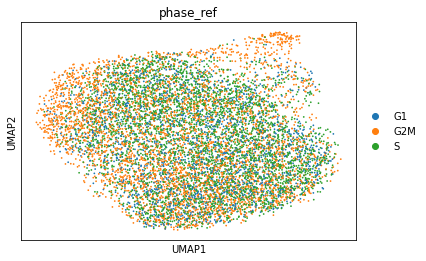

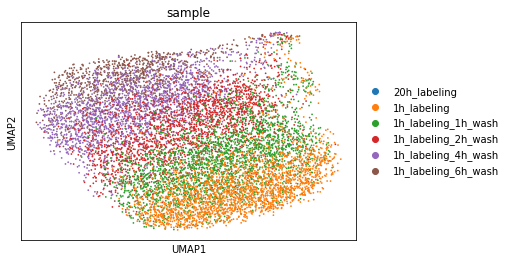

In [31]:
pp_pca_umap(adata_n, pp=True)
sc.pp.neighbors(adata_n, metric='euclidean', n_neighbors=15)
sc.tl.umap(adata_n, min_dist=0.5)
sc.pl.umap(adata_n, color='phase_ref')
sc.pl.umap(adata_n, color='sample')

### PHATE

In [32]:
phate_nc = phate.PHATE(n_jobs=1, knn=30, decay=15, t='auto', gamma=1)
Y_phate_nc = phate_nc.fit_transform(adata_n)
phate_nc.set_params(n_components=3)
Y_phate_3d_nc = phate_nc.transform()

Calculating PHATE...
  Running PHATE on 9833 observations and 1982 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 0.65 seconds.
    Calculating KNN search...
    Calculated KNN search in 17.31 seconds.
    Calculating affinities...
    Calculated affinities in 24.63 seconds.
  Calculated graph and diffusion operator in 44.18 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 27.29 seconds.
    Calculating KMeans...
    Calculated KMeans in 17.50 seconds.
  Calculated landmark operator in 58.42 seconds.
  Calculating optimal t...
    Automatically selected t = 6
  Calculated optimal t in 2.01 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.58 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 7.85 seconds.
Calculated PHATE in 113.09 seconds.
Calculating metric MDS...
Calculated metric MDS in 82.90 seconds.


In [35]:
pd.DataFrame(Y_phate_3d_nc).to_csv('PHATE embedding.csv')

In [33]:
plotly_nc = pd.DataFrame(Y_phate_3d_nc, columns=['x', 'y', 'z'])
plotly_nc['cell_cycle'] = adata_n.obs['phase_ref'].values
plotly_nc['orig_index'] = adata_n.obs['orig_index'].values
plotly_nc['sample'] = adata_n.obs['sample'].values
plotly_nc['reads_per_cell'] = adata_n.obs['n_counts'].values
plotly_nc

,x,y,z,cell_cycle,orig_index,sample,reads_per_cell
0,0.013247,-0.003326,-0.000404,G2M,0,1h_labeling_6h_wash,964.0
1,0.012642,-0.003324,-0.000939,G1,3,1h_labeling_6h_wash,501.0
2,-0.007703,-0.000064,-0.000161,G2M,4,1h_labeling_6h_wash,990.0
3,0.007019,-0.002776,-0.000706,G2M,6,1h_labeling_6h_wash,1173.0
4,-0.003968,-0.000917,-0.000366,G2M,7,1h_labeling_6h_wash,1026.0
...,...,...,...,...,...,...,...
9828,-0.017808,0.002431,0.000367,S,4237,1h_labeling,742.0
9829,-0.015272,0.001750,0.000288,G2M,4238,1h_labeling,595.0
9830,-0.016499,0.002126,0.000305,S,4242,1h_labeling,484.0
9831,-0.016152,0.002066,0.000267,G1,4245,1h_labeling,376.0


In [34]:
fig = px.scatter_3d(plotly_nc, x='x', y='y', z='z', color='sample', color_discrete_map=sam_col, opacity=1, template='simple_white', custom_data=['orig_index', 'cell_cycle', 'sample']) #, color_discrete_map=cc_col
fig.update_traces(marker=dict(size=1.5, line=dict(width=0)), hovertemplate="<br>".join([
        "X: %{x}",
        "Y: %{y}",
        "Z: %{z}",
        "ind: %{customdata[0]}",
        "cc: %{customdata[1]}",
        "sam: %{customdata[2]}",
    ]))

In [35]:
fig = px.scatter_3d(plotly_nc, x='x', y='y', z='z', color='cell_cycle', color_discrete_map=cc_col, opacity=1, template='simple_white', custom_data=['orig_index', 'cell_cycle', 'sample'], )
fig.update_traces(marker=dict(size=1.5, line=dict(width=0)), hovertemplate="<br>".join([
        "X: %{x}",
        "Y: %{y}",
        "Z: %{z}",
        "ind: %{customdata[0]}",
        "cc: %{customdata[1]}",
        "sam: %{customdata[2]}",
    ]))

### Diffusion Map

In [46]:
sc.pp.neighbors(adata_n, n_neighbors=30)
sc.tl.diffmap(adata_n)
adata_n

AnnData object with n_obs × n_vars = 9833 × 1982
    obs: 'orig_index', 'sample', 'volume', 'x', 'y', 'z', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'condition', 'phase_ref', 'KD_label_combined'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'max_counts', 'n_cells', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'phase_ref_colors', 'sample_colors', 'diffmap_evals'
    obsm: 'X_pca', 'X_umap', 'X_diffmap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [49]:
sc.tl.diffmap(adata_n)
plotly_n_dm = pd.DataFrame(adata_n.obsm['X_diffmap'][:,:3], columns=['x', 'y', 'z'])
plotly_n_dm['cell_cycle'] = adata_n.obs['phase_ref'].values
plotly_n_dm['orig_index'] = adata_n.obs['orig_index'].values
plotly_n_dm['sample'] = adata_n.obs['sample'].values
plotly_n_dm['reads_per_cell'] = adata_n.obs['n_counts'].values
plotly_n_dm

,x,y,z,cell_cycle,orig_index,sample,reads_per_cell
0,-0.008821,-0.006512,-0.012011,G2M,0,1h_labeling_6h_wash,964.0
1,-0.011702,-0.007402,-0.017316,G1,3,1h_labeling_6h_wash,501.0
2,-0.009426,0.001796,-0.001629,G2M,4,1h_labeling_6h_wash,990.0
3,-0.010642,-0.005251,-0.011952,G2M,6,1h_labeling_6h_wash,1173.0
4,-0.008710,0.000747,-0.003500,G2M,7,1h_labeling_6h_wash,1026.0
...,...,...,...,...,...,...,...
9828,-0.009596,0.006620,0.010933,S,4237,1h_labeling,742.0
9829,-0.008761,0.004864,0.006547,G2M,4238,1h_labeling,595.0
9830,-0.010623,0.006842,0.010681,S,4242,1h_labeling,484.0
9831,-0.011936,0.008816,0.015352,G1,4245,1h_labeling,376.0


In [50]:
fig = px.scatter_3d(plotly_n_dm, x='x', y='y', z='z', color='sample', color_discrete_map=sam_col, opacity=1, template='simple_white', custom_data=['orig_index', 'cell_cycle', 'sample'])
fig.update_traces(marker=dict(size=1.5, line=dict(width=0)), hovertemplate="<br>".join([
        "X: %{x}",
        "Y: %{y}",
        "Z: %{z}",
        "ind: %{customdata[0]}",
        "cc: %{customdata[1]}",
        "sam: %{customdata[2]}",
    ]))

In [51]:
fig = px.scatter_3d(plotly_n_dm, x='x', y='y', z='z', color='cell_cycle', color_discrete_map=cc_col, opacity=1, template='simple_white', custom_data=['orig_index', 'cell_cycle', 'sample'])
fig.update_traces(marker=dict(size=1.5, line=dict(width=0)), hovertemplate="<br>".join([
        "X: %{x}",
        "Y: %{y}",
        "Z: %{z}",
        "ind: %{customdata[0]}",
        "cc: %{customdata[1]}",
        "sam: %{customdata[2]}",
    ]))

# nuclear retention

In [70]:
adata_6h = separate_adata_by_sample(adata_all, sample_list[4], layers_n)
adata_6h = adata_remove_genes(adata_6h, starmap_genes, layers_n) 
adata_6h = adata_remove_cells(adata_6h, 'KD_label_combined', 'siYTHDC1', layers_n)

In [74]:
# process as single-cell will have many zero-division => proceeded as bulk sample
retention = np.sum(adata_6h.layers['nucleus'], axis=0) / np.sum(adata_6h.layers['cytoplasm'], axis=0)

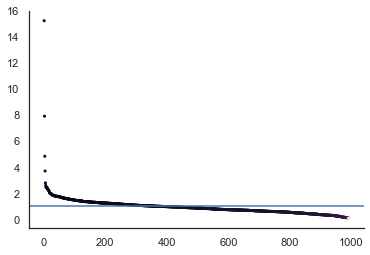

In [121]:
sns.set_theme(style='white')
x = np.arange(1, 992)
plt.scatter(x, np.sort(retention)[::-1], s=4, c=np.sort(retention))
plt.axhline(y=1)
sns.despine()
plt.savefig('nuclear retention.pdf')

In [119]:
genes_ns = genes[np.where(np.isin(np.array(genes), np.array(starmap_genes), invert=True))]
df_retention = pd.DataFrame(zip(genes_ns, retention), columns=['genes', 'retention rate'])
df_retention.sort_values(by='retention rate', ascending=True).head(10)
df_retention.to_excel('nuclear retention.xlsx')